<a href="https://www.kaggle.com/code/ainurrohmanbwx/youtube-videos-analytics?scriptVersionId=147641583" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction

Our analysis of YouTube video data involves the collection of videos from various countries and encompasses data preprocessing steps, including handling missing values and duplicate data. Subsequently, in the exploratory analysis phase, we will conduct sentiment evaluation, wordcloud analysis, and emoji analysis. In the next stage, our analysis will focus on determining the most favored video categories, audience engagement levels, and the identification of the most popular videos. Lastly, we will investigate the impact of punctuation usage on the number of views, likes, and dislikes, with the goal of understanding the influence of these factors on content popularity on the YouTube platform.

# Load data

In [1]:
# Disable warning

import warnings

warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=FutureWarning)

### Load comment data

In [2]:
import pandas as pd

youtube_comments = pd.read_csv('/kaggle/input/uscommentcsv/UScomment.csv')
youtube_comments.head()

,Unnamed: 0,video_id,comment_text,likes,replies
0,0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0
1,1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0
2,2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0
3,3,XpVt6Z1Gjjo,MY FAN . attendance,3,0
4,4,XpVt6Z1Gjjo,trending 😉,3,0


In [3]:
youtube_comments.shape

(2000, 5)

In [4]:
youtube_comments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Unnamed: 0    2000 non-null   int64 
 1   video_id      2000 non-null   object
 2   comment_text  1999 non-null   object
 3   likes         2000 non-null   int64 
 4   replies       2000 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 78.2+ KB


### Collecting all YouTube data (Data collection)

In [5]:
import os

files = os.listdir('/kaggle/input/youtube-new')
files

['GBvideos.csv',
 'MXvideos.csv',
 'KRvideos.csv',
 'MX_category_id.json',
 'GB_category_id.json',
 'US_category_id.json',
 'IN_category_id.json',
 'DEvideos.csv',
 'KR_category_id.json',
 'RU_category_id.json',
 'FRvideos.csv',
 'USvideos.csv',
 'INvideos.csv',
 'RUvideos.csv',
 'CA_category_id.json',
 'DE_category_id.json',
 'JP_category_id.json',
 'JPvideos.csv',
 'FR_category_id.json',
 'CAvideos.csv']

In [6]:
# filter only files csv

files_csv = [file for file in files if '.csv' in file]
files_csv

['GBvideos.csv',
 'MXvideos.csv',
 'KRvideos.csv',
 'DEvideos.csv',
 'FRvideos.csv',
 'USvideos.csv',
 'INvideos.csv',
 'RUvideos.csv',
 'JPvideos.csv',
 'CAvideos.csv']

In [7]:
youtube_videos = pd.DataFrame()
path = '/kaggle/input/youtube-new'

for file in files_csv:
    current_df = pd.read_csv(path+'/'+file, encoding='iso-8859-1')
    youtube_videos = pd.concat([youtube_videos, current_df], ignore_index=True)

In [8]:
youtube_videos.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,Jw1Y-zhQURU,17.14.11,John Lewis Christmas Ad 2017 - #MozTheMonster,John Lewis,26,2017-11-10T07:38:29.000Z,"christmas|""john lewis christmas""|""john lewis""|...",7224515,55681,10247,9479,https://i.ytimg.com/vi/Jw1Y-zhQURU/default.jpg,False,False,False,Click here to continue the story and make your...
1,3s1rvMFUweQ,17.14.11,Taylor Swift: â¦Ready for It? (Live) - SNL,Saturday Night Live,24,2017-11-12T06:24:44.000Z,"SNL|""Saturday Night Live""|""SNL Season 43""|""Epi...",1053632,25561,2294,2757,https://i.ytimg.com/vi/3s1rvMFUweQ/default.jpg,False,False,False,Musical guest Taylor Swift performs â¦Ready f...
2,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787420,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...
3,PUTEiSjKwJU,17.14.11,Goals from Salford City vs Class of 92 and Fri...,Salford City Football Club,17,2017-11-13T02:30:38.000Z,"Salford City FC|""Salford City""|""Salford""|""Clas...",27833,193,12,37,https://i.ytimg.com/vi/PUTEiSjKwJU/default.jpg,False,False,False,Salford drew 4-4 against the Class of 92 and F...
4,rHwDegptbI4,17.14.11,Dashcam captures truck's near miss with child ...,Cute Girl Videos,25,2017-11-13T01:45:13.000Z,[none],9815,30,2,30,https://i.ytimg.com/vi/rHwDegptbI4/default.jpg,False,False,False,Dashcam captures truck's near miss with child ...


In [9]:
youtube_videos.shape

(375942, 16)

In [10]:
youtube_videos.columns

Index(['video_id', 'trending_date', 'title', 'channel_title', 'category_id',
       'publish_time', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'thumbnail_link', 'comments_disabled', 'ratings_disabled',
       'video_error_or_removed', 'description'],
      dtype='object')

### Export data to csv, json, and SQL

In [11]:
from sqlalchemy import create_engine

youtube_videos[0:1000].to_csv('/kaggle/working/youtube_sample.csv', index=False)
youtube_videos[0:1000].to_json('/kaggle/working/youtube_sample.json')

engine = create_engine(r'sqlite:////kaggle/working/youtube_sample.sqlite')
youtube_videos[0:1000].to_sql('Users', con=engine, if_exists='append')

1000

# Data preprocessing

### Checking for missing values comment data 

In [12]:
# Check for missing values
missing_values = youtube_comments.isnull().sum()

# Display columns with missing values and the count of missing values
missing_values = missing_values[missing_values > 0]

if not missing_values.empty:
    print("Columns with missing values:")
    for column, count in missing_values.items():
        print(f"{column}: {count} missing values")
else:
    print("There are no columns with missing value")

Columns with missing values:
comment_text: 1 missing values


In [13]:
# remove missing values
youtube_comments = youtube_comments.dropna()

In [14]:
# Check for missing values
missing_values = youtube_comments.isnull().sum()

# Display columns with missing values and the count of missing values
missing_values = missing_values[missing_values > 0]

if not missing_values.empty:
    print("Columns with missing values:")
    for column, count in missing_values.items():
        print(f"{column}: {count} missing values")
else:
    print("There are no columns with missing value")

There are no columns with missing value


### Checking for missing values video data 

In [15]:
# Check for missing values
missing_values = youtube_videos.isnull().sum()

# Display columns with missing values and the count of missing values
missing_values = missing_values[missing_values > 0]

if not missing_values.empty:
    print("Columns with missing values:")
    for column, count in missing_values.items():
        print(f"{column}: {count} missing values")
else:
    print("There are no columns with missing value")

Columns with missing values:
description: 19478 missing values


In [16]:
# remove missing values
youtube_videos = youtube_videos.dropna()

In [17]:
# Check for missing values
missing_values = youtube_comments.isnull().sum()

# Display columns with missing values and the count of missing values
missing_values = missing_values[missing_values > 0]

if not missing_values.empty:
    print("Columns with missing values:")
    for column, count in missing_values.items():
        print(f"{column}: {count} missing values")
else:
    print("There are no columns with missing value")

There are no columns with missing value


### Check duplicate video data

In [18]:
if youtube_videos.duplicated().any():
    print(f"There are as many as {youtube_videos.duplicated().sum()} duplicate data.")
else:
    print("There are no duplicate data.")

There are as many as 34916 duplicate data.


In [19]:
# remove duplicate rows
youtube_videos.drop_duplicates(inplace=True)

In [20]:
# Check again after removing
if youtube_videos.duplicated().any():
    print(f"There are as many as {uber.duplicated().sum()} duplicate data.")
else:
    print("There are no duplicate data.")

There are no duplicate data.


# Exploratory Data Analysis

### Sentiment analysis

In [21]:
from textblob import TextBlob

sentiment = []

for comment in youtube_comments['comment_text']:
    try:
        polarity = TextBlob(comment).sentiment.polarity
        if polarity > 0:
            sentiment.append('positive')
        elif polarity < 0:
            sentiment.append('negative')
        else:
            sentiment.append('neutral')
    except:
        sentiment.append('neutral')

In [22]:
len(sentiment)

1999

In [23]:
youtube_comments['sentiment'] = sentiment

In [24]:
youtube_comments.head()

,Unnamed: 0,video_id,comment_text,likes,replies,sentiment
0,0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,neutral
1,1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,neutral
2,2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,neutral
3,3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,neutral
4,4,XpVt6Z1Gjjo,trending 😉,3,0,neutral


### Wordcloud analysis

In [25]:
comment_positive = youtube_comments[youtube_comments['sentiment']=='positive']
comment_neutral = youtube_comments[youtube_comments['sentiment']=='neutral']
comment_negative = youtube_comments[youtube_comments['sentiment']=='negative']

In [26]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

def generate_and_display_wordcloud(text, stopwords=None):
    if stopwords is None:
        stopwords = set(STOPWORDS)
    
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        width=800,                
        height=400,                
        colormap='viridis'       
    ).generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [27]:
comment_positive = ' '.join(comment_positive['comment_text'].tolist())

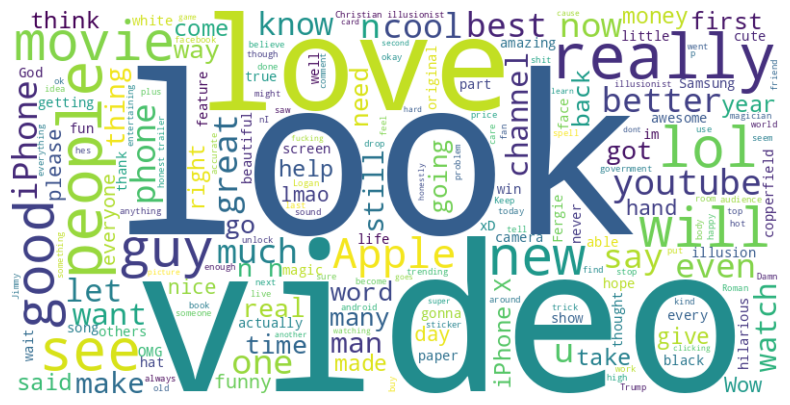

In [28]:
generate_and_display_wordcloud(comment_positive)

In [29]:
comment_negative = ' '.join(comment_negative['comment_text'].tolist())

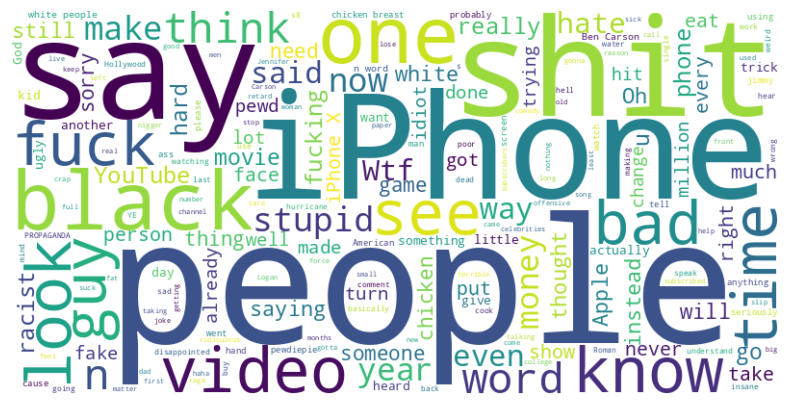

In [30]:
generate_and_display_wordcloud(comment_negative)

In [31]:
comment_neutral = ' '.join(comment_neutral['comment_text'].tolist())

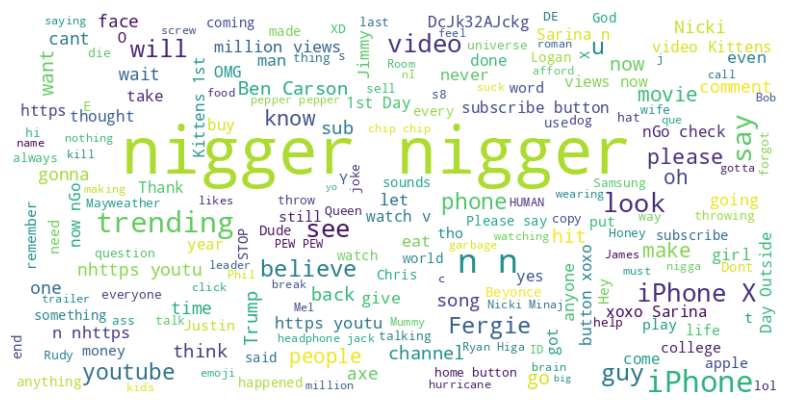

In [32]:
generate_and_display_wordcloud(comment_neutral)

### Emoji analysis

In [33]:
import emoji

emoji_list = [char for char in youtube_comments if char in emoji.EMOJI_DATA]
all_emojis_list = [char for comment in youtube_comments['comment_text'] for char in comment if char in emoji.EMOJI_DATA]

In [34]:
from collections import Counter

Counter(all_emojis_list).most_common(10)

[('😂', 184),
 ('❤', 55),
 ('😍', 35),
 ('😮', 27),
 ('🔥', 21),
 ('👏', 17),
 ('💖', 15),
 ('😆', 14),
 ('😊', 14),
 ('😭', 11)]

In [35]:
emoticon = [Counter(all_emojis_list).most_common(10)[i][0] for i in range(10)]
freqs = [Counter(all_emojis_list).most_common(10)[i][1] for i in range(10)]

In [36]:
import plotly.express as px

data = {
    'Emoticon': emoticon,
    'Frequency': freqs
}

color_palette = px.colors.sequential.Blues

fig = px.bar(data, x='Emoticon', y='Frequency', color='Frequency', color_continuous_scale=color_palette)

fig.update_traces(marker_line_width=1.5, opacity=0.6)

fig.update_layout(
    xaxis_title='Emoticon',
    yaxis_title='Frequency',
    font=dict(family="Arial", size=12),
    plot_bgcolor='white',
    title_text='Top 10 Emoticon Usage',
    title_x=0.5
)

fig.update_xaxes(categoryorder='total descending')

fig.show()

### Analyze the most preferred categories

In [37]:
json_df = pd.read_json('/kaggle/input/youtube-new/US_category_id.json')
json_df.head()

,kind,etag,items
0,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
1,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
2,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
3,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."
4,youtube#videoCategoryListResponse,"""m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJv...","{'kind': 'youtube#videoCategory', 'etag': '""m2..."


In [38]:
json_df['items'][0]

{'kind': 'youtube#videoCategory',
 'etag': '"m2yskBQFythfE4irbTIeOgYYfBU/Xy1mB4_yLrHy_BmKmPBggty2mZQ"',
 'id': '1',
 'snippet': {'channelId': 'UCBR8-60-B28hp2BmDPdntcQ',
  'title': 'Film & Animation',
  'assignable': True}}

In [39]:
cat_dict = {}

for item in json_df['items'].values:
    cat_dict[int(item['id'])] = item['snippet']['title']

In [40]:
cat_dict

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 29: 'Nonprofits & Activism',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

In [41]:
youtube_videos['category_name'] = youtube_videos['category_id'].map(cat_dict)

In [42]:
youtube_videos[['category_name']].head()

,category_name
0,Howto & Style
1,Entertainment
2,Music
3,Sports
4,News & Politics


In [43]:
color_palette = 'BLues'

data = youtube_videos.groupby('category_name')['likes'].median().reset_index()
data = data.sort_values(by='likes', ascending=False)

# Creating the plot using Plotly Express
fig = px.bar(
    data, x='category_name', y='likes',
    title='Median Likes by YouTube Video Category',
    labels={'category_name': 'Category Name', 'likes': 'Median Likes'},
    color='likes',
    color_continuous_scale=color_palette, 
)

fig.update_layout(showlegend=False, title_x=0.5)

fig.show()

### Determine if the audience is actively involved or not

In [44]:
youtube_videos['like_rate'] = (youtube_videos['likes']/youtube_videos['views'])*100
youtube_videos['dislike_rate'] = (youtube_videos['dislikes']/youtube_videos['views'])*100
youtube_videos['comment_count_rate'] = (youtube_videos['comment_count']/youtube_videos['views'])*100

In [45]:
youtube_videos[['like_rate', 'dislike_rate', 'comment_count_rate']].head()

,like_rate,dislike_rate,comment_count_rate
0,0.770723,0.141837,0.131206
1,2.425989,0.217723,0.261666
2,4.589075,0.253051,0.733639
3,0.693421,0.043114,0.132936
4,0.305655,0.020377,0.305655


In [46]:
import plotly.graph_objects as go

fig = go.Figure()

categories = youtube_videos['category_name'].unique()
for category in categories:
    data = youtube_videos[youtube_videos['category_name'] == category]
    
    fig.add_trace(go.Box(
        y=data['like_rate'],
        name=category,
        boxpoints='all',
        jitter=0.3,
        pointpos=-1.8,
        boxmean=True
    ))

fig.update_layout(
    title='Box Plot of Like Rate by Category',
    xaxis=dict(
        title='Category',
        showticklabels=True,
        tickangle=45
    ),
    yaxis=dict(
        title='Like Rate'
    ),
    showlegend=True,
    title_x=0.5
)

fig.show()

In [47]:
fig = px.scatter(youtube_videos, x='views', y='likes',
                 labels={'views': 'Views', 'likes': 'Likes'})

fig.update_layout(
    title_text='Scatter Plot of Views vs Likes',
    title_x=0.5 
)

fig.update_traces(marker=dict(size=5)) 

fig.show()

In [48]:
import plotly.figure_factory as ff

correlation_matrix = youtube_videos[['views', 'likes', 'dislikes']].corr()

# Create a figure using Plotly Figure Factory
fig = ff.create_annotated_heatmap(
            z=correlation_matrix.values.round(2),
            x=list(correlation_matrix.columns),
            y=list(correlation_matrix.index),
            colorscale='Blues'
)

fig.update_layout(
    title_text='Correlation Heatmap of Views, Likes, and Dislikes',
    title_x=0.5,
)

fig.show()

### Examining the popular videos on YouTube.

In [49]:
youtube_videos['channel_title'].value_counts()

channel_title
The Late Show with Stephen Colbert    710
WWE                                   643
Late Night with Seth Meyers           592
TheEllenShow                          555
Jimmy Kimmel Live                     528
                                     ... 
One Team Football                       1
Futurpop TV                             1
Joke Brant                              1
ZENjk51                                 1
SevenSuperGirls                         1
Name: count, Length: 34186, dtype: int64

In [50]:
cdf = youtube_videos.groupby(['channel_title']).size().sort_values(ascending=False).reset_index()
cdf.head()

,channel_title,0
0,The Late Show with Stephen Colbert,710
1,WWE,643
2,Late Night with Seth Meyers,592
3,TheEllenShow,555
4,Jimmy Kimmel Live,528


In [51]:
cdf = cdf.rename(columns={0:'total_videos'})
cdf.head()

,channel_title,total_videos
0,The Late Show with Stephen Colbert,710
1,WWE,643
2,Late Night with Seth Meyers,592
3,TheEllenShow,555
4,Jimmy Kimmel Live,528


In [52]:
color_palette = "Blues"

fig = px.bar(
        data_frame=cdf[0:20],
        x='channel_title',
        y='total_videos',
        color='total_videos',
        color_continuous_scale=color_palette
)

fig.update_layout(
    title='Top 20 Channels by Total Videos',
    xaxis_title='Channel Title',
    yaxis_title='Total Videos',
    title_x=0.5,
    coloraxis_showscale=True, 
    template='plotly',
)

fig.show()

### Do punctuation marks affect the number of views, likes, and dislikes?

In [53]:
import string

def punc_count(text):
    return len([char for char in text if char in string.punctuation])

In [54]:
sample_df = youtube_videos[0:10000]
sample_df['count_punc'] = sample_df['title'].apply(punc_count)

In [55]:
fig = go.Figure()

# Create the box plot
fig.add_trace(go.Box(x=sample_df['count_punc'], y=sample_df['views'], boxpoints='outliers', jitter=0.3, pointpos=-1.8))

# Customize the layout
fig.update_layout(
    title="Boxplot of Views by Punctuation Count",
    xaxis_title="Punctuation Count",
    yaxis_title="Views",
    title_x=0.5,
    showlegend=False
)

# Customize the appearance of the boxes and whiskers
fig.update_traces(boxmean=True, marker=dict(size=6), line=dict(width=1))

# Show the plot
fig.show()

In [56]:
fig = go.Figure()

# Create the box plot
fig.add_trace(go.Box(x=sample_df['count_punc'], y=sample_df['likes'], boxpoints='outliers', jitter=0.3, pointpos=-1.8))

# Customize the layout
fig.update_layout(
    title="Boxplot of Likes by Punctuation Count",
    xaxis_title="Punctuation Count",
    yaxis_title="Likes",
    title_x=0.5,
    showlegend=False
)

# Customize the appearance of the boxes and whiskers
fig.update_traces(boxmean=True, marker=dict(size=6), line=dict(width=1))

# Show the plot
fig.show()

In [57]:
# Create a box plot using Plotly
fig = go.Figure()

# Add box plot trace
fig.add_trace(go.Box(x=sample_df['count_punc'], y=sample_df['dislikes'], boxpoints='outliers', jitter=0.3, pointpos=-1.8))

# Customize the layout
fig.update_layout(
    title="Boxplot of Dislikes by Punctuation Count",
    xaxis_title="Punctuation Count",
    yaxis_title="Dislikes",
    title_x=0.5,
    showlegend=False
)

# Customize the appearance of the boxes and whiskers
fig.update_traces(boxmean=True, marker=dict(size=6), line=dict(width=1))

# Show the plot
fig.show()